In [1]:
# Basic libraries
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import warnings
warnings.filterwarnings('ignore')
from math import ceil
from collections import defaultdict
from tqdm.notebook import tqdm        # Progress bar library for Jupyter Notebook

# Deep learning framework for building and training models
import tensorflow as tf
## Pre-trained model for image feature extraction
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import load_img, img_to_array

## Tokenizer class for captions tokenization
from tensorflow.keras.preprocessing.text import Tokenizer

## Function for padding sequences to a specific length
from tensorflow.keras.preprocessing.sequence import pad_sequences

## Class for defining Keras models
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, concatenate, Bidirectional, Dot, Activation, RepeatVector, Multiply, Lambda

# For checking score
from nltk.translate.bleu_score import corpus_bleu

print("Done Importing Libraries")

2024-04-13 11:11:22.068304: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-13 11:11:22.068415: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-13 11:11:22.195594: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Done Importing Libraries


# Setting up Directories

In [2]:
# Setting the input and output directory
INPUT_DIR = '/kaggle/input/flickr8k'
OUTPUT_DIR = '/kaggle/working'

# ResNet 50 for Feature Extraction

In [42]:
# Load the ResNet50 model
model = ResNet50()

# Restructuring the model to remove the last classification layer, this will give us access to the output features of the model
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

# Printing the model summary
print(model.summary())

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_4[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

None


## Extracting the features and saving them 

In [4]:
# Initialize an empty dictionary to store image features
image_features = {}

# Define the directory path where images are located
img_dir = os.path.join(INPUT_DIR, 'Images')

# Loop through each image in the directory
for img_name in tqdm(os.listdir(img_dir)):
    # Load the image from file
    img_path = os.path.join(img_dir, img_name)
    image = load_img(img_path, target_size=(224, 224))
    # Convert image pixels to a numpy array
    image = img_to_array(image)
    # Reshape the data for the model
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    # Preprocess the image for ResNet50
    image = preprocess_input(image)
    # Extract features using the pre-trained ResNet50 model
    image_feature = model.predict(image, verbose=0)
    # Get the image ID by removing the file extension
    image_id = img_name.split('.')[0]
    # Store the extracted feature in the dictionary with the image ID as the key
    image_features[image_id] = image_feature

  0%|          | 0/8091 [00:00<?, ?it/s]

I0000 00:00:1713006722.108000      82 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


In [5]:
# Store the image features in pickle
pickle.dump(image_features, open(os.path.join(OUTPUT_DIR, 'img_features.pkl'), 'wb'))

In [43]:
# Load features from pickle file
pickle_file_path = os.path.join(OUTPUT_DIR, 'img_features.pkl')
with open(pickle_file_path, 'rb') as file:
    loaded_features = pickle.load(file)

In [44]:
#Loading caption Data
with open(os.path.join(INPUT_DIR, 'captions.txt'), 'r') as file:
    next(file)
    captions_doc = file.read()

In [45]:
# Create mapping of image to captions
image_to_captions_mapping = defaultdict(list)

# Process lines from captions_doc
for line in tqdm(captions_doc.split('\n')):
    # Split the line by comma(,)
    tokens = line.split(',')
    if len(tokens) < 2:
        continue
    image_id, *captions = tokens
    # Remove extension from image ID
    image_id = image_id.split('.')[0]
    # Convert captions list to string
    caption = " ".join(captions)
    # Store the caption using defaultdict
    image_to_captions_mapping[image_id].append(caption)

# Print the total number of captions
total_captions = sum(len(captions) for captions in image_to_captions_mapping.values())
print("Total number of captions:", total_captions)

  0%|          | 0/40456 [00:00<?, ?it/s]

Total number of captions: 40455


In [46]:
# Function for processing the captions
def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
            # Take one caption at a time
            caption = captions[i]
            # Preprocessing steps
            # Convert to lowercase
            caption = caption.lower()
            # Remove non-alphabetical characters
            caption = ''.join(char for char in caption if char.isalpha() or char.isspace())
            # Remove extra spaces
            caption = caption.replace('\s+', ' ')
            # Add unique start and end tokens to the caption
            caption = 'startseq ' + ' '.join([word for word in caption.split() if len(word) > 1]) + ' endseq'
            captions[i] = caption

In [47]:
# before preprocess of text
image_to_captions_mapping['1026685415_0431cbf574']

['A black dog carries a green toy in his mouth as he walks through the grass .',
 'A black dog carrying something through the grass .',
 'A black dog has a blue toy in its mouth .',
 'A dog in grass with a blue item in his mouth .',
 'A wet black dog is carrying a green toy through the grass .']

In [48]:
# preprocess the text
clean(image_to_captions_mapping)
# after preprocess of text
image_to_captions_mapping['1026685415_0431cbf574']

['startseq black dog carries green toy in his mouth as he walks through the grass endseq',
 'startseq black dog carrying something through the grass endseq',
 'startseq black dog has blue toy in its mouth endseq',
 'startseq dog in grass with blue item in his mouth endseq',
 'startseq wet black dog is carrying green toy through the grass endseq']

In [49]:
# Creating a List of All Captions
all_captions = [caption for captions in image_to_captions_mapping.values() for caption in captions]

In [50]:
all_captions[:10]

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq',
 'startseq black dog and spotted dog are fighting endseq',
 'startseq black dog and tricolored dog playing with each other on the road endseq',
 'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
 'startseq two dogs of different breeds looking at each other on the road endseq',
 'startseq two dogs on pavement moving toward each other endseq']

In [51]:
# Tokenizing the Text
tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)

In [52]:
# Save the tokenizer
with open('tokenizer.pkl', 'wb') as tokenizer_file:
    pickle.dump(tokenizer, tokenizer_file)

# Load the tokenizer
with open('tokenizer.pkl', 'rb') as tokenizer_file:
    tokenizer = pickle.load(tokenizer_file)

In [53]:
# Calculate maximum caption length
max_caption_length = max(len(tokenizer.texts_to_sequences([caption])[0]) for caption in all_captions)
vocab_size = len(tokenizer.word_index) + 1

# Print the results
print("Vocabulary Size:", vocab_size)
print("Maximum Caption Length:", max_caption_length)

Vocabulary Size: 8768
Maximum Caption Length: 34


In [54]:
# Creating a List of Image IDs
image_ids = list(image_to_captions_mapping.keys())
# Splitting into Training and Test Sets
split = int(len(image_ids) * 0.90)
train = image_ids[:split]
test = image_ids[split:]

In [55]:
# Data generator function
def data_generator(data_keys, image_to_captions_mapping, features, tokenizer, max_caption_length, vocab_size, batch_size):
    # Lists to store batch data
    X1_batch, X2_batch, y_batch = [], [], []
    # Counter for the current batch size
    batch_count = 0

    while True:
        # Loop through each image in the current batch
        for image_id in data_keys: 
            # Get the captions associated with the current image
            captions = image_to_captions_mapping[image_id]

            # Loop through each caption for the current image
            for caption in captions:
                # Convert the caption to a sequence of token IDs
                caption_seq = tokenizer.texts_to_sequences([caption])[0]

                # Loop through the tokens in the caption sequence
                for i in range(1, len(caption_seq)):
                    # Split the sequence into input and output pairs
                    in_seq, out_seq = caption_seq[:i], caption_seq[i]

                    # Pad the input sequence to the specified maximum caption length
                    in_seq = pad_sequences([in_seq], maxlen=max_caption_length)[0]

                    # Convert the output sequence to one-hot encoded format
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]

                    # Append data to batch lists
                    X1_batch.append(tuple(features[image_id][0]))  # Convert to tuple
                    X2_batch.append(tuple(in_seq))             # Convert to tuple 
                    y_batch.append(tuple(out_seq))  

                    # Increase the batch counter
                    batch_count += 1

                    # If the batch is complete, yield the batch and reset lists and counter
                    if batch_count == batch_size:
                        X1_batch, X2_batch, y_batch = np.array(X1_batch), np.array(X2_batch), np.array(y_batch)
                        yield (X1_batch, X2_batch), y_batch
                        X1_batch, X2_batch, y_batch = [], [], []
                        batch_count = 0

se1 shape: (None, 34, 256)
se1 dtype: float32
inputs2 shape: (None, 34)
mask shape: (None, 34)
se2 shape: (None, 34, 256)


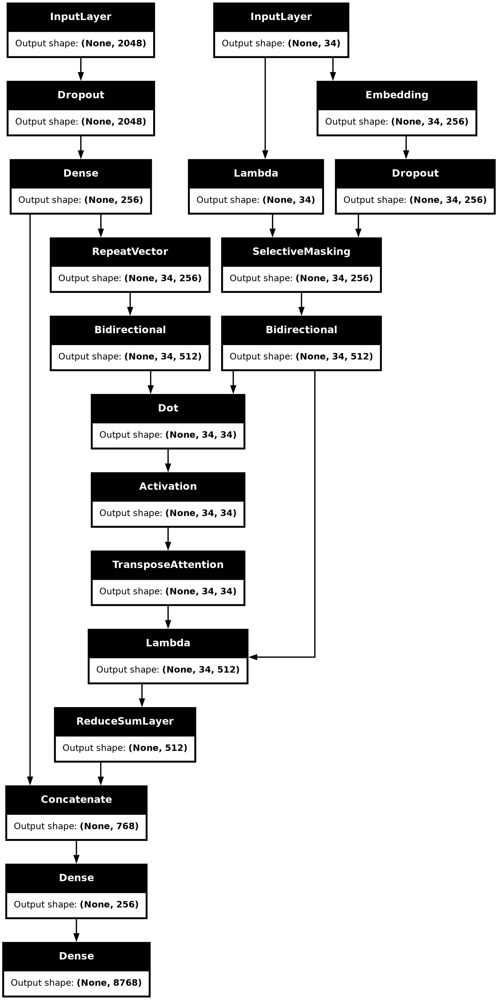

In [56]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dropout, Dense, RepeatVector, Bidirectional, LSTM, Dot, Activation, Lambda, concatenate, Layer
from tensorflow.keras.regularizers import L1, L2 
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model

# Constants  
vocab_size = 8768  
max_caption_length = 34  

# Encoder model
inputs1 = Input(shape=(2048,))  
fe1 = Dropout(0.5)(inputs1) 
fe2 = Dense(256, activation='relu')(fe1)
fe2_projected = RepeatVector(max_caption_length)(fe2)
fe2_projected = Bidirectional(LSTM(256, return_sequences=True))(fe2_projected)

# Sequence feature layers
inputs2 = Input(shape=(max_caption_length,))  
se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)  # Masking in the embedding
print("se1 shape:", se1.shape)
print("se1 dtype:", se1.dtype)
se2 = Dropout(0.5)(se1)

# Reapply masking
def create_padding_mask(seq):
    mask = tf.math.not_equal(seq, 0)  
    mask = tf.cast(mask, tf.float32)  
    return mask  

mask = Lambda(create_padding_mask)(inputs2) 

# Selective Masking Layer
class SelectiveMasking(Layer):
    def __init__(self, **kwargs):
        super(SelectiveMasking, self).__init__(**kwargs)

    def call(self, inputs):
        mask, tensor = inputs  
        mask = tf.expand_dims(mask, axis=-1) 
        masked_tensor = tensor * mask 
        return masked_tensor

    def compute_output_shape(self, input_shape):
        return input_shape[1] 
print("inputs2 shape:", inputs2.shape) 
print("mask shape:", mask.shape)
print("se2 shape:", se2.shape)
se2 = SelectiveMasking()([mask, se2])  

se3 = Bidirectional(LSTM(256, return_sequences=True))(se2)

# Attention mechanism 
attention = Dot(axes=[2, 2])([fe2_projected, se3])  
attention_scores = Activation('softmax')(attention)

# Transpose attention scores 
class TransposeAttention(Layer):
    def __init__(self, **kwargs):
        super(TransposeAttention, self).__init__(**kwargs)

    def call(self, inputs):
        return tf.transpose(inputs, perm=[0, 2, 1]) 

attention_scores = TransposeAttention()(attention_scores) 

# Apply attention scores 
attention_context = Lambda(lambda x: tf.einsum('ijk,ijl->ikl', x[0], x[1]))([attention_scores, se3])

class ReduceSumLayer(Layer):
    def __init__(self, axis=1, **kwargs):  
        self.axis = axis
        super(ReduceSumLayer, self).__init__(**kwargs)

    def call(self, inputs):
        return tf.reduce_sum(inputs, axis=self.axis) 

context_vector = ReduceSumLayer()(attention_context)
# Sum attended embeddings
#context_vector = tf.reduce_sum(attention_context, axis=1)

# Decoder model 
decoder_input = concatenate([context_vector, fe2], axis=-1)
decoder1 = Dense(256, activation='relu')(decoder_input)  
outputs = Dense(vocab_size, activation='softmax')(decoder1)

# Create the model
model = Model(inputs=[inputs1, inputs2], outputs=outputs)
model.compile(loss='categorical_crossentropy', optimizer='adam')

# Visualize the model
plot_model(model, show_shapes=True)

In [57]:
# Creating a List of Image IDs
image_ids = list(image_to_captions_mapping.keys())
# Splitting into Training and Test Sets
split = int(len(image_ids) * 0.90)
train = image_ids[:split]
test = image_ids[split:]

In [58]:
print(test[0:100])

['436015762_8d0bae90c3', '436393371_822ee70952', '436608339_f1d1298770', '437054333_5c2761b8cd', '437404867_209625774d', '437527058_189f2a7eef', '437917001_ae1106f34e', '438639005_208bc59b0b', '439037721_cdf1fc7358', '439049388_3dcee2d30b', '439492931_a96d590e40', '439569646_c917f1bc78', '439916996_1ddb9dc8e7', '440184957_267f3f3a2b', '440190907_bf8b7ba8ef', '440737340_5af34ca9cf', '441212506_fcc321ac28', '44129946_9eeb385d77', '441398149_297146e38d', '441817653_fbdf83060b', '441921713_1cafc7d7d2', '442220883_ff3d6e507f', '442594271_2c3dd38483', '442918418_0f29c97fa9', '443430496_3fea95a07d', '443885436_6e927e6c58', '444047125_66b249287c', '444057017_f1e0fcaef7', '444481722_690d0cadcf', '444803340_fdcaab86f9', '444845904_a4531c811a', '444872454_9f51e07f88', '444881000_bba92e585c', '445148321_9f2f3ac711', '445655284_c29e6d7323', '445861800_75fc6a8c16', '446138054_d40c66d5f0', '446286714_dcec7f339e', '446291803_2fd4641b99', '446514680_ff5ca15ece', '447111935_5af98563e3', '447722389_4b51b

In [59]:
# Set the number of epochs, batch size
epochs = 50
batch_size = 32

# Calculate the steps_per_epoch based on the number of batches in one epoch
steps_per_epoch = ceil(len(train) / batch_size)
validation_steps = ceil(len(test) / batch_size)  # Calculate the steps for validation data

# Loop through the epochs for training
for epoch in range(epochs):
    print(f"Epoch {epoch+1}/{epochs}")
    
    # Set up data generators
    train_generator = data_generator(train, image_to_captions_mapping, loaded_features, tokenizer, max_caption_length, vocab_size, batch_size)
    test_generator = data_generator(test, image_to_captions_mapping, loaded_features, tokenizer, max_caption_length, vocab_size, batch_size)
    
    model.fit(train_generator, epochs=1, steps_per_epoch=steps_per_epoch,
          validation_data=test_generator, validation_steps=validation_steps,
          verbose=1)

Epoch 1/50
228/228 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - loss: 6.6463 - val_loss: 6.0763
Epoch 2/50
228/228 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 4.9614 - val_loss: 6.0191
Epoch 3/50
228/228 ━━━━━━━━━━━━━━━━━━━━ 16s 72ms/step - loss: 4.4076 - val_loss: 6.1297
Epoch 4/50
228/228 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 3.9120 - val_loss: 6.1918
Epoch 5/50
228/228 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 3.4964 - val_loss: 6.9317
Epoch 6/50
228/228 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 3.1301 - val_loss: 7.3206
Epoch 7/50
228/228 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 2.9048 - val_loss: 7.2927
Epoch 8/50
228/228 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 2.6157 - val_loss: 7.7592
Epoch 9/50
228/228 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 2.3131 - val_loss: 8.3440
Epoch 10/50
228/228 ━━━━━━━━━━━━━━━━━━━━ 17s 73ms/step - loss: 2.1558 - val_loss: 8.1293
Epoch 11/50
228/228 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - loss: 1.9616 - val_loss: 8.1084
Epoch 12/50
228/228 ━━━━━━━━━━

In [60]:
# Save the model
model.save(OUTPUT_DIR+'/final_model.keras')

In [61]:
def get_word_from_index(index, tokenizer):
    return next((word for word, idx in tokenizer.word_index.items() if idx == index), None)

In [62]:
def predict_caption(model, image_features, tokenizer, max_caption_length):
    # Initialize the caption sequence
    caption = 'startseq'
    
    # Generate the caption
    for _ in range(max_caption_length):
        # Convert the current caption to a sequence of token indices
        sequence = tokenizer.texts_to_sequences([caption])[0]
        # Pad the sequence to match the maximum caption length
        sequence = pad_sequences([sequence], maxlen=max_caption_length)
        # Predict the next word's probability distribution
        yhat = model.predict([image_features, sequence], verbose=0)
        # Get the index with the highest probability
        predicted_index = np.argmax(yhat)
        # Convert the index to a word
        predicted_word = get_word_from_index(predicted_index, tokenizer)
        
        # Append the predicted word to the caption
        caption += " " + predicted_word
        
        # Stop if the word is None or if the end sequence tag is encountered
        if predicted_word is None or predicted_word == 'endseq':
            break
    
    return caption

In [63]:
# Initialize lists to store actual and predicted captions
actual_captions_list = []
predicted_captions_list = []

# Loop through the test data
for key in tqdm(test):
    # Get actual captions for the current image
    actual_captions = image_to_captions_mapping[key]
    # Predict the caption for the image using the model
    predicted_caption = predict_caption(model, loaded_features[key], tokenizer, max_caption_length)
    
    # Split actual captions into words
    actual_captions_words = [caption.split() for caption in actual_captions]
    # Split predicted caption into words
    predicted_caption_words = predicted_caption.split()
    
    # Append to the lists
    actual_captions_list.append(actual_captions_words)
    predicted_captions_list.append(predicted_caption_words)

# Calculate BLEU score
print("BLEU-1: %f" % corpus_bleu(actual_captions_list, predicted_captions_list, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual_captions_list, predicted_captions_list, weights=(0.5, 0.5, 0, 0)))

  0%|          | 0/810 [00:00<?, ?it/s]

BLEU-1: 0.446979
BLEU-2: 0.206720


# Inference on training:

In [71]:
# Function for generating caption
def generate_caption(image_name):
    # load the image
    image_id = image_name.split('.')[0]
    img_path = os.path.join(INPUT_DIR, "Images", image_name)
    image = Image.open(img_path)
    captions = image_to_captions_mapping[image_id]
    y_pred = predict_caption(model, loaded_features[image_id], tokenizer, max_caption_length)
    print('--------------------Predicted--------------------')
    print(y_pred)
    plt.imshow(image)

--------------------Predicted--------------------
startseq man in hat is displaying pictures next to skier in front of wall endseq


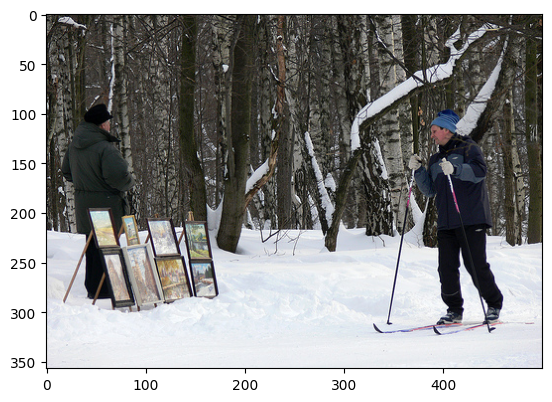

In [72]:
generate_caption("101669240_b2d3e7f17b.jpg")

--------------------Predicted--------------------
startseq boy sliding down slide into pool with colorful tubes endseq


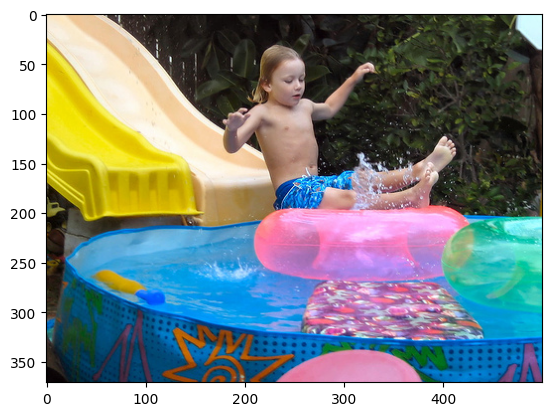

In [73]:
generate_caption("1077546505_a4f6c4daa9.jpg")


--------------------Predicted--------------------
startseq little girl is sitting in front of large painted rainbow endseq


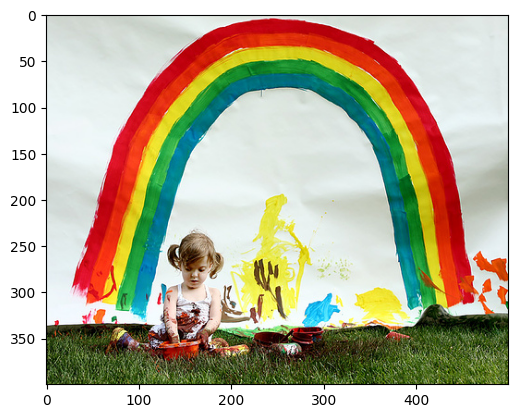

In [74]:
generate_caption("1002674143_1b742ab4b8.jpg")

--------------------Predicted--------------------
startseq man stands in front of skyscraper endseq


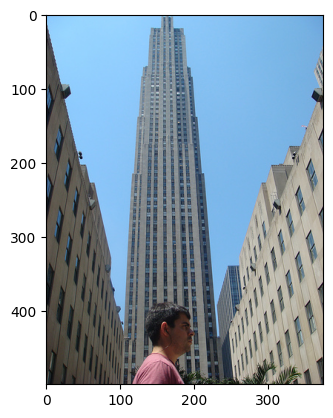

In [75]:
generate_caption("1032460886_4a598ed535.jpg")

--------------------Predicted--------------------
startseq three dogs play along grassy hill endseq


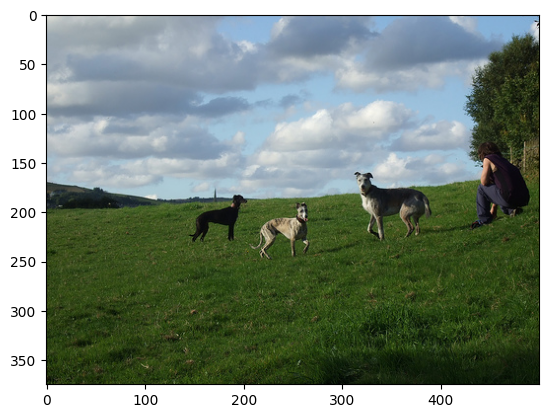

In [76]:
generate_caption("1032122270_ea6f0beedb.jpg")

--------------------Predicted--------------------
startseq black dog and tricolored dog playing with each other on the road endseq


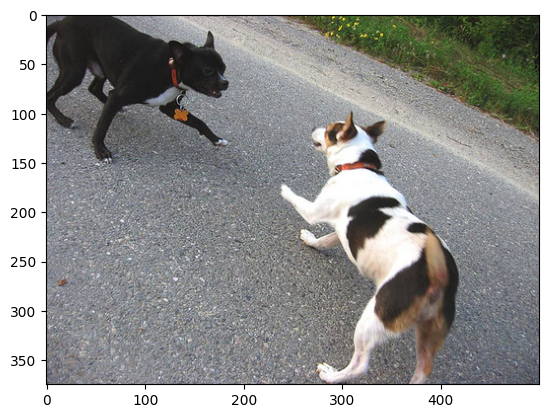

In [77]:
generate_caption("1001773457_577c3a7d70.jpg")

--------------------Predicted--------------------
startseq girl going into wooden building endseq


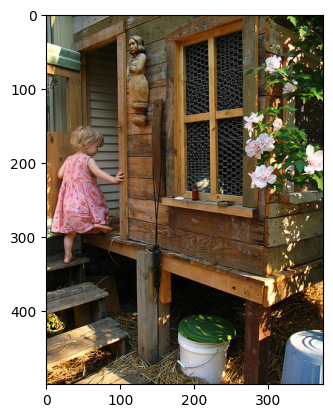

In [78]:
generate_caption("1000268201_693b08cb0e.jpg")

--------------------Predicted--------------------
startseq two skiers are playing on tractor along beautiful day endseq


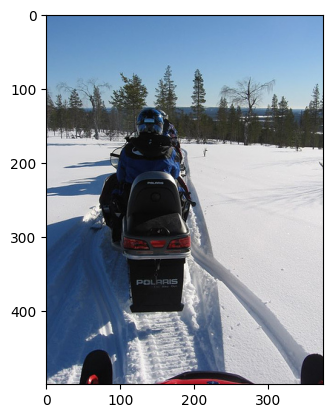

In [83]:
generate_caption("437527058_189f2a7eef.jpg")

In [161]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt
from nltk.translate.bleu_score import sentence_bleu

def generate_test_captions(test_images):
    while True:
        # Select a random image from the test set
        image_name = random.choice(test_images)
        
        # Load the image
        image_path = os.path.join(INPUT_DIR, "Images", image_name + '.jpg')  # Add the file extension
        image = Image.open(image_path)
        
        # Predict the caption for the image
        image_id = image_name.split('.')[0]
        predicted_caption = predict_caption(model, loaded_features[image_id], tokenizer, max_caption_length)
        
        # Compute BLEU score
        actual_captions = image_to_captions_mapping[image_id]
        actual_captions_words = [caption.split() for caption in actual_captions]
        predicted_caption_words = predicted_caption.split()
        bleu_score = sentence_bleu(actual_captions_words, predicted_caption_words)
        
        # Display the image and its caption if BLEU score is higher than 0.7
        if bleu_score > 0.7:
            print('--------------------Predicted for', image_name, '--------------------')
            print('Predicted Caption:', predicted_caption)
            print('BLEU Score:', bleu_score)
            plt.imshow(image)
            plt.show()
            break  # Exit the loop once an image with BLEU score > 0.7 is found




# Inference on Test

--------------------Predicted for 537532165_e4b7c0e61a --------------------
Predicted Caption: startseq the boy is jumping on wall endseq
BLEU Score: 0.8408964152537145


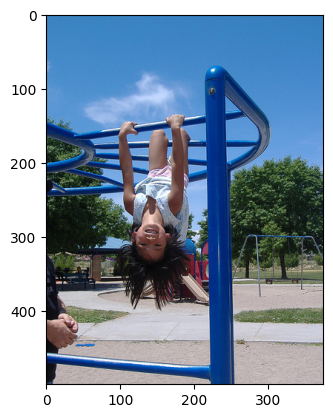

In [113]:
generate_test_captions(test)

--------------------Predicted for 890734502_a5ae67beac --------------------
Predicted Caption: startseq the little girl is playing with toy in public fountain endseq
BLEU Score: 0.8739351325046805


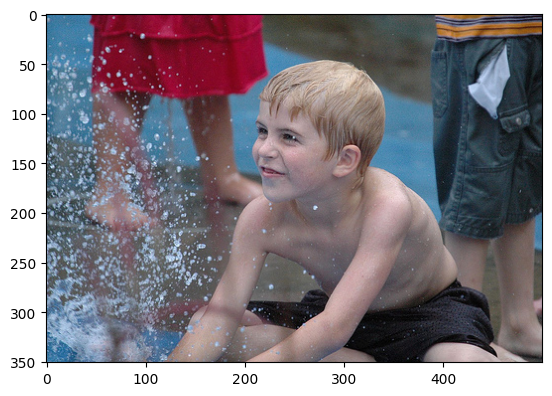

In [115]:
generate_test_captions(test)

--------------------Predicted for 468930779_8008d90e10 --------------------
Predicted Caption: startseq this is black dog splashing in grassy water endseq
BLEU Score: 0.8408964152537145


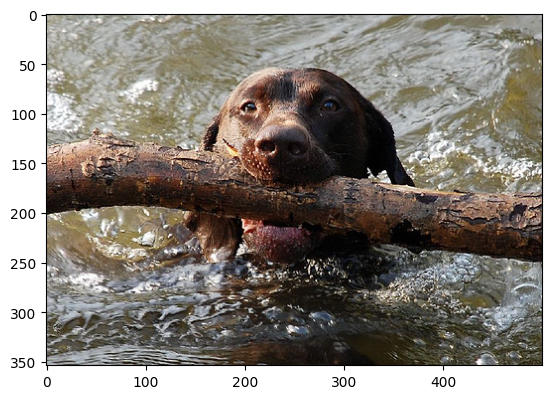

In [116]:
generate_test_captions(test)

--------------------Predicted for 482882307_7dcb9eee11 --------------------
Predicted Caption: startseq the children are playing in the water endseq
BLEU Score: 0.8633400213704505


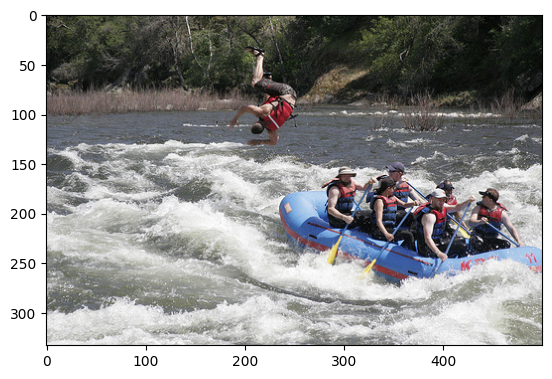

In [118]:
generate_test_captions(test)

--------------------Predicted for 485566887_57eac33bd1 --------------------
Predicted Caption: startseq large brown dog is resting up into the ground endseq
BLEU Score: 0.8210967436686386


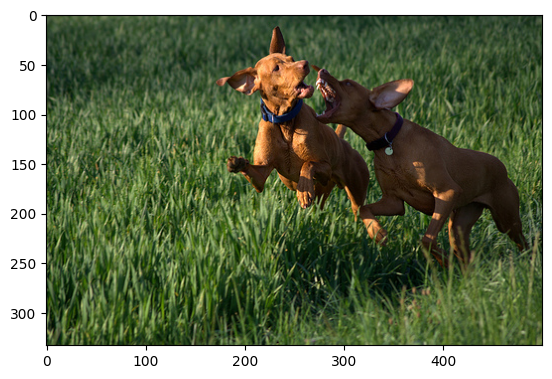

In [121]:
generate_test_captions(test)

--------------------Predicted for 512634877_d7ad8c8329 --------------------
Predicted Caption: startseq the small dog is running in the sand endseq
BLEU Score: 0.8408964152537145


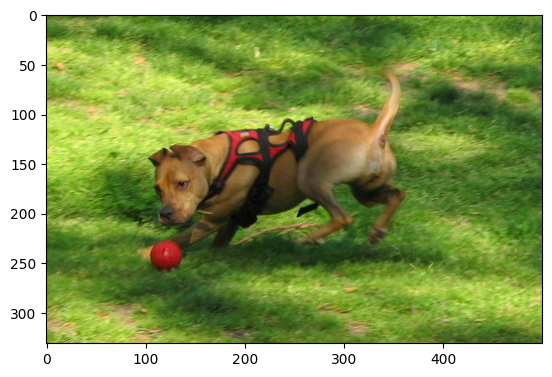

In [123]:
generate_test_captions(test)

--------------------Predicted for 535399240_0714a6e950 --------------------
Predicted Caption: startseq man and woman are sitting on dock together at night endseq
BLEU Score: 0.8408964152537145


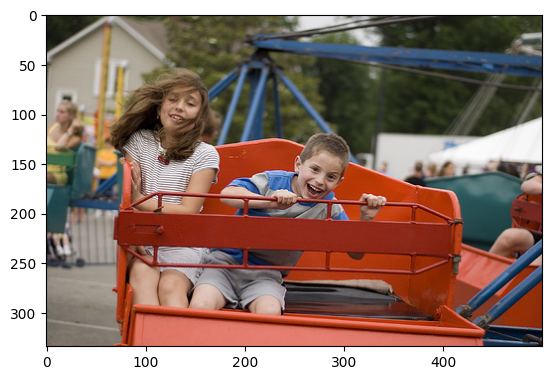

In [128]:
generate_test_captions(test)

--------------------Predicted for 461019788_bc0993dabd --------------------
Predicted Caption: startseq man and woman are sitting on ledge overlooking the beach endseq
BLEU Score: 0.8408964152537145


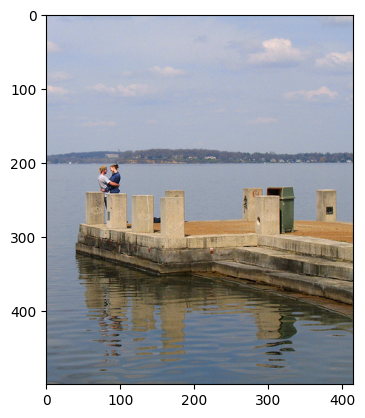

In [135]:
generate_test_captions(test)

--------------------Predicted for 69710411_2cf537f61f --------------------
Predicted Caption: startseq three people stand by two dogs stand by contained fire endseq
BLEU Score: 0.8034284189446518


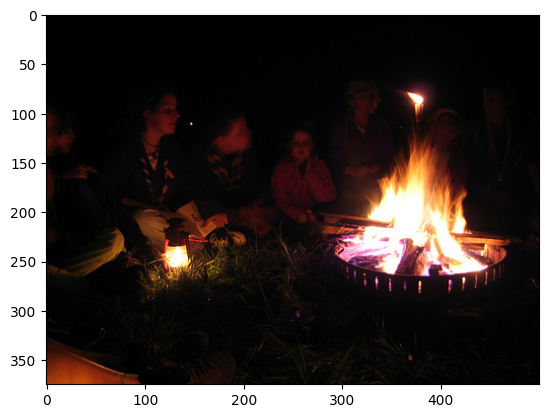

In [141]:
generate_test_captions(test)

--------------------Predicted for 58357057_dea882479e --------------------
Predicted Caption: startseq the skier is playing in the mountainside endseq
BLEU Score: 0.816496580927726


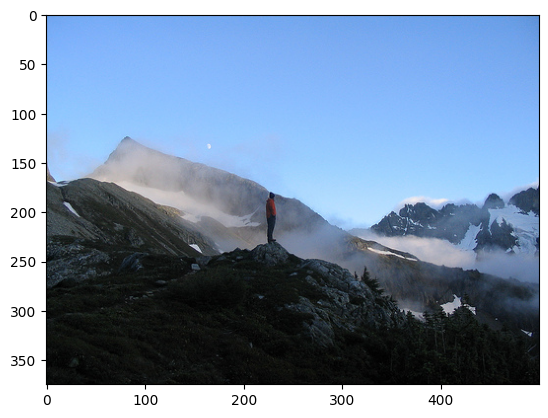

In [157]:
generate_test_captions(test)

--------------------Predicted for 519059913_4906fe4050 --------------------
Predicted Caption: startseq the little girl is playing in the water endseq
BLEU Score: 0.7952707287670506


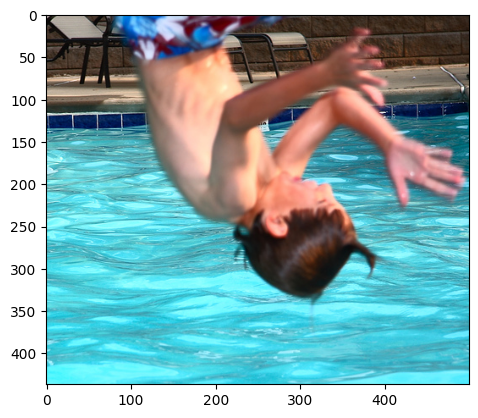

In [162]:
generate_test_captions(test)

--------------------Predicted for 57417274_d55d34e93e --------------------
Predicted Caption: startseq shaft of hikers played on day endseq
BLEU Score: 0.8408964152537145


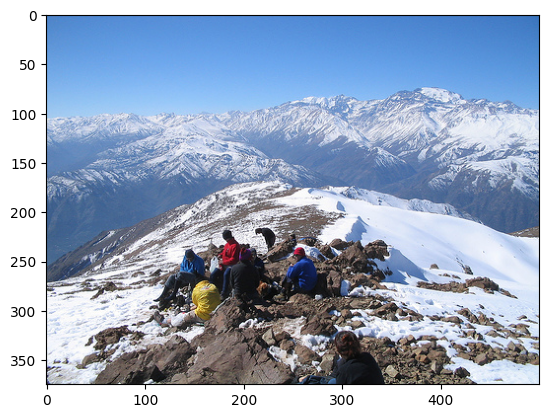

In [172]:
generate_test_captions(test)

--------------------Predicted for 640409060_6af18fdd54 --------------------
Predicted Caption: startseq the little girl is playing in the water endseq
BLEU Score: 0.7721947901921794


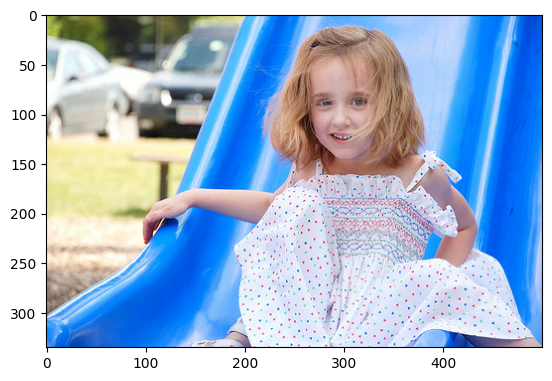

In [174]:
generate_test_captions(test)

--------------------Predicted for 512031915_0dd03dcdf9 --------------------
Predicted Caption: startseq the small dog is playing on the shore of an orange ball endseq
BLEU Score: 0.723976807888871


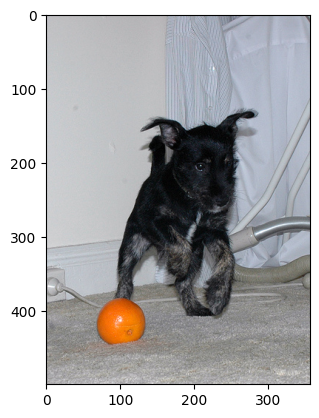

In [178]:
generate_test_captions(test)

--------------------Predicted for 762947607_2001ee4c72 --------------------
Predicted Caption: startseq the boy is jumping on an old fashioned field endseq
BLEU Score: 0.8210967436686386


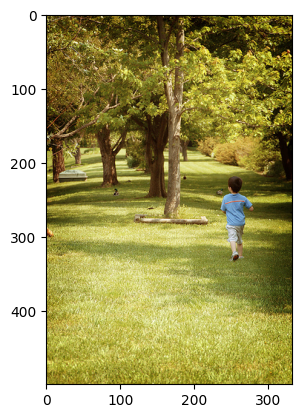

In [187]:
generate_test_captions(test)

--------------------Predicted for 539751252_2bd88c456b --------------------
Predicted Caption: startseq boy sliding down slide into pool with colorful mouths endseq
BLEU Score: 0.7765453555044466


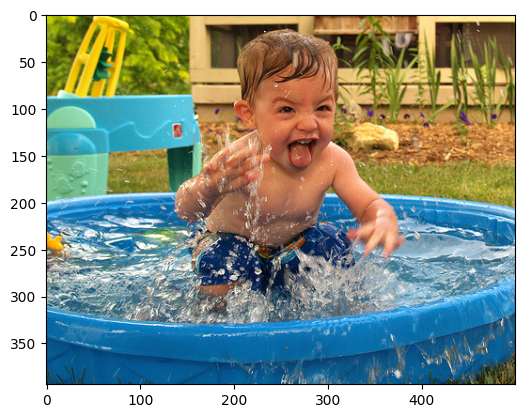

In [191]:
generate_test_captions(test)

--------------------Predicted for 491405109_798222cfd0 --------------------
Predicted Caption: startseq the boy is looking at the side of the camera endseq
BLEU Score: 0.7071067811865476


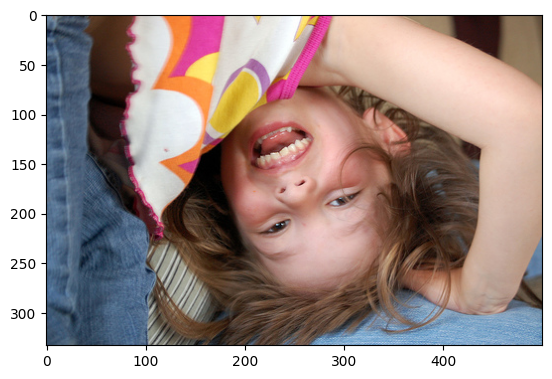

In [198]:
generate_test_captions(test)

--------------------Predicted for 857914283_270d7d1c87 --------------------
Predicted Caption: startseq man is standing with his arms outstretched while another boy endseq
BLEU Score: 0.7071067811865476


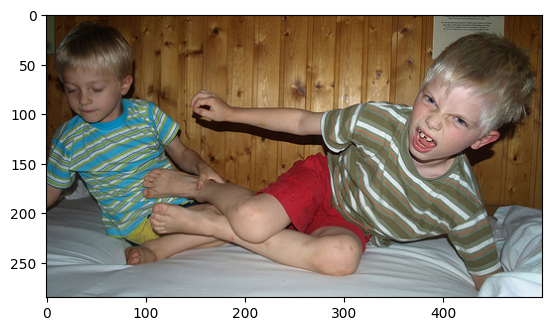

In [202]:
generate_test_captions(test)